In [3]:
# import random
import csv
import matplotlib.pyplot as plt
import numpy as np
# import openpyxl
import scipy
from scipy import stats
import statsmodels.api as sm
from sklearn.cluster import KMeans
# import seaborn
import pandas as pd 

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

# CODE

## Part 1. Create database

### 1.1 Obtain Every Needful Thing

In [4]:
class Crash():
    def __init__(self, crash_id, crash_datetime, lat, long, crash_severity_id,\
                 vehicle_id, vehicle_speed, posted_speed, person_id, age_calculated,\
                 injury_level_id, sex, light_condition_id, weather_condition_id,\
                 horizontal_alignment_id, vertical_alignment_id, nonmotor_location_id, \
                 location_description):
        # Crash general
        self.crash_id = crash_id
        self.crash_datetime = crash_datetime
        self.lat = lat
        self.long = long
        self.crash_severity_id = crash_severity_id
        
        # Vehicle
        self.vehicle_id = vehicle_id
        self.vehicle_speed = vehicle_speed # likely the speed of the vehicle just before the crash
        self.posted_speed = posted_speed

        # Person - all fields below are arrays
        self.person_id = person_id # 1-Driver, 2-Passenger, 3-Pedestrian, 4-Pedalcyclist 
        self.age_calculated = age_calculated # watch out for value 0 and -99
        self.injury_level_id = injury_level_id # 1-No injury, 2-Possible injury, 3-Suspected Minor Injury, 4-Suspected Serious Injury, 5-Fatal
        self.sex = sex

        # Other conditions
        self.light_condition_id = light_condition_id
        self.weather_condition_id = weather_condition_id
        self.horizontal_alignment_id = horizontal_alignment_id
        self.vertical_alignment_id = vertical_alignment_id
        self.nonmotor_location_id = nonmotor_location_id
        self.location_description = location_description
        
    def __str__(self):
        return f"CRASH DATA  \n Crash ID: {self.crash_id} \n Date Time: {self.crash_datetime} \n Latitude: {self.lat} \n Longitude: {self.long} \
                             \n Crash severity: {self.crash_severity_id} \
                             \n Vehicle ID: {self.vehicle_id} \n Vehicle Speed: {self.vehicle_speed} \n Posted Speed: {self.posted_speed} \
                             \n Person ID: {self.person_id} \n Age: {self.age_calculated} \n Injury level: {self.injury_level_id} \n Sex: {self.sex} \
                             \n Light condition: {self.light_condition_id} \n Weather condition: {self.weather_condition_id} \
                             \n Horizontal alignment: {self.horizontal_alignment_id} \n Vertical alignment: {self.vertical_alignment_id} \
                             \n Non-motor location: {self.nonmotor_location_id} \n Location description: {self.location_description} "


In [5]:
def findcompnum(crash, crash_id):
    for i in range (0,len(crash)):
        if crash[i].crash_id==crash_id:
            return(i)
    return(-1)

In [45]:
def readcrashdata(crash, path):
    crashsheet   = pd.read_excel(path, sheet_name = 0)
    vehiclesheet = pd.read_excel(path, sheet_name = 1)
    personsheet  = pd.read_excel(path, sheet_name = 2)

    crashsheet.replace(r'^\s*$', np.nan, regex=True, inplace=True) 
    vehiclesheet.replace(r'^\s*$', np.nan, regex=True, inplace=True)
    personsheet.replace(r'^\s*$', np.nan, regex=True, inplace=True)
    
    for i in range(0, len(crashsheet)):
        crash_id = crashsheet['crash_id'][i]
        compnum = findcompnum(crash, crash_id)
        if compnum == -1:
            # Crash general
            crash_datetime = crashsheet['crash_datetime'][i]
            lat      = crashsheet['lat'][i]
            long     = crashsheet['long'][i]
            crash_severity_id = crashsheet['crash_severity_id'][i]

            # Vehicle
            vehicle_id = [] # some crashes involved more than one vehicle
            vehicle_speed = [] 
            posted_speed = ''

            # Person
            person_id = []
            age_calculated = []
            injury_level_id = []
            sex = []
            nonmotor_location_id = []

            # Intersection and Conditions
            light_condition_id = crashsheet['light_condition_id'][i]
            weather_condition_id = crashsheet['weather_condition_id'][i]
            horizontal_alignment_id = crashsheet['horizontal_alignment_id'][i]
            vertical_alignment_id = crashsheet['vertical_alignment_id'][i]
            location_description = crashsheet['location_description'][i]
            

            # Adding vehicle data
            for j in range(0,len(vehiclesheet)):
                if vehiclesheet['crash_id'][j] == crash_id:
                    vehicle_id.append(vehiclesheet['vehicle_id'][j])
                    vehicle_speed.append(vehiclesheet['estimated_travel_speed'][j])
                    posted_speed  = vehiclesheet['posted_speed'][j]
                    
                    
            # Adding person data
            # Add people in the vehicle(s)
            for vec_id in vehicle_id:
                temp = [[] for _ in range(4)] # the number in this range is the number of parameters of Person Data
                for k in range(0, len(personsheet)):
                    if personsheet['crash_id'][k] == crash_id:
                        if personsheet['vehicle_id'][k] == vec_id:
                            temp[0].append(personsheet['person_id'][k])
                            temp[1].append(personsheet['age_calculated'][k])
                            temp[2].append(personsheet['injury_level_id'][k])
                            temp[3].append(personsheet['sex'][k])
                            # temp4[4].append(personsheet['nonmotor_location_id'][k])
                person_id.append(temp[0])
                age_calculated.append(temp[1])
                injury_level_id.append(temp[2])
                sex.append(temp[3])
                # nonmotor_location_id.append(temp[4])
                            
            # Add pedalcylist
            for z in range(0, len(personsheet)):
                if personsheet['crash_id'][z] == crash_id and personsheet['person_id'][z] == 4:
                    person_id.append([personsheet['person_id'][z]])
                    age_calculated.append([personsheet['age_calculated'][z]])
                    injury_level_id.append([personsheet['injury_level_id'][z]])
                    sex.append([personsheet['sex'][z]])
                    nonmotor_location_id.append(personsheet['nonmotor_location_id'][z])
                    
            crash.append(Crash(crash_id, crash_datetime, lat, long, crash_severity_id,\
                 vehicle_id, vehicle_speed, posted_speed, person_id, age_calculated,\
                 injury_level_id, sex, light_condition_id, weather_condition_id,\
                 horizontal_alignment_id, vertical_alignment_id, nonmotor_location_id, location_description))
        else:
            print('Something is wrong.')


### 1.2 Run the Thing (took me 6 mins!)

In [7]:
crash = []
path = "Raw_crash_data_for_Salt_Lake_County.xlsx"
readcrashdata(crash, path)


### 1.3 Test the data

In [8]:
for i in range(0, len(crash)):
    if crash[i].crash_id == 10347801:
        print(crash[i]) 
# Note: Vehicle ID and Vehicle speed don't apply for the pedalcyclist

CRASH DATA  
 Crash ID: 10347801 
 Date Time: 2010-01-24 14:57:00 
 Latitude: 40.62078169 
 Longitude: -111.885777                              
 Crash severity: 3                              
 Vehicle ID: ['10347801_1', '10347801_2'] 
 Vehicle Speed: [4, 25] 
 Posted Speed: 40                              
 Person ID: [[2, 1], [2, 1], [4]] 
 Age: [[3, 41], [68, 71], [52]] 
 Injury level: [[1, 1], [1, 1], [3]] 
 Sex: [['M', 'F'], ['F', 'M'], ['M']]                              
 Light condition: 1 
 Weather condition: 2                              
 Horizontal alignment: 1 
 Vertical alignment: 1                              
 Non-motor location: [2] 
 Location description: 7200 SOUTH, at 175 EAST 


## Part 2 - Cluster Analysis on Latitude and Longitude

### 2.1 Calculate distance

In [9]:
def distance (x1, x2):
    if len(x1)!=len(x2):
        print ('error in calculating distance')
        input()
    dist=0
    for i in range (0,len(x1)):
        dist+=pow(x1[i]-x2[i],2)
    dist=pow(dist,1)
    return(dist)

### 2.2 Calculate Silhouette index

In [10]:
def calcsilhouetteindex(data,clustersolution):
    silhouettevalue=[]
    for i in range (0, len(data)):
        silhouettevalue.append(0)
        
    maxclusters=max(clustersolution)+1
    disscore=[]
    numdis=[]
    for i in range(0,maxclusters):
        disscore.append(0)
        numdis.append(0)
    for i in range(0, len(data)):
        simscore=0
        numincluster=0
        mindiscore=10000
        for j in range(0,len(data)):
            if i!=j:
                if clustersolution[i]==clustersolution[j]:
                    simscore+=distance(data[i], data[j])
                    numincluster+=1
                else:
                    disscore[clustersolution[j]]+=distance(data[i], data[j])
                    numdis[clustersolution[j]]+=1
        for k in range(0, maxclusters):
            if disscore[k]>.0001:
                if k != clustersolution[i] and numdis[k]>=1:
                    if disscore[k]/numdis[k]<mindiscore:
                        mindiscore= disscore[k]/numdis[k]
        if numincluster==0:
            silhouettevalue[i]=0
        else:
            if mindiscore>simscore/numincluster:
                silhouettevalue[i]= 1-(simscore/numincluster)/mindiscore
            else:
                silhouettevalue[i]= mindiscore/(simscore/numincluster) -1
    silhouettescore=np.average(silhouettevalue)
    
    return(silhouettescore)

### 2.3 Set Parameters to Get Ready for Clustering

In [11]:
minclusters=2
maxclusters=10
numberofkmeanstried=1
scalethedata=True

### 2.4.1 Add Points to `data`
`data` is a double array with points from 2 dimensions to n dimensions

For this analysis, we're adding longitude and latitude.

In [12]:
scalethedata=False
data=[]
for i in range(0, len(crash)):
    if crash[i].lat!= 0.0 and crash[i].crash_severity_id >= 3:
        point = [crash[i].long, crash[i].lat] 
        data.append(point)

In [13]:
# export locations to a csv for Google Map
with open('crashlocations.csv', mode='w', newline='') as file:
    writer = csv.writer(file)
    writer.writerows(data)

### 2.4.2 Scale the Data (if needed)

In [14]:
def scaledata(scalethedata, data):
    if scalethedata==True:
        maxi=[]
        mini=[]
        for j in range(0, len(data[0])):
            tempmin=1000000000
            tempmax=-1000000000
            for i in range (0,len(data)):
                if data[i][j]>tempmax:
                    tempmax=data[i][j]
                if data[i][j]<tempmin:
                     tempmin=data[i][j]
            maxi.append(tempmax)
            mini.append(tempmin)
        scaleddata=[]
        for i in range(0,len(data)):
            temp = []
            for j in range (0,len(data[0])):
                scalpt= data[i][j] -mini[j]
                scalpt=scalpt/(maxi[j]-mini[j])
                temp.append(scalpt)
            scaleddata.append(temp)
    return scaleddata

### 2.5 Store best Silhouette clusters and k-mean clusters

In [15]:
def beststuff(data,minclusters,maxclusters,scalethedata):
    bestsilclusters=[]
    bestsilobjective=[]
    bestkmeansclusters=[]
    bestkmeansobjective=[]
    for i in range (0,maxclusters):
        tempk=[]
        for i in range (0, len(data)):
            tempk.append(-1)
        temps=[]
        for i in range (0, len(data)):
            temps.append(-1)
        bestsilclusters.append(tempk)
        bestkmeansclusters.append(temps)
        bestsilobjective.append(-1)
        bestkmeansobjective.append(1000000)
        
    for k in range (minclusters,maxclusters):
        for iterations in range (0, numberofkmeanstried):
            if iterations%50==0:
                print('num cluster', k, ' iteration ', iterations)
            numclusters=k
            model = KMeans(n_clusters=numclusters,init="random", max_iter=300)
            if scalethedata==True:
                model.fit(data)
            else:
                model.fit(data)
                
            objective = model.inertia_
            point_to_cluster = model.labels_
            if objective < bestkmeansobjective[k]:
                bestkmeansobjective[k]=objective
                for p in range (0, len(point_to_cluster)):
                    # print('k = ',k)
                    # print('p = ', p)
                    # print('bestkmeansclusters[k][p] = ', bestkmeansclusters[k][p])
                    # print('point_to_cluster[p] = ',point_to_cluster[p])
                    bestkmeansclusters[k][p]=point_to_cluster[p]  ### problem here
            centroids=model.cluster_centers_
            silobjective=calcsilhouetteindex(data, point_to_cluster)   
            if silobjective > bestsilobjective[k]:
                bestsilobjective[k]=silobjective
                for p in range (0, len(point_to_cluster)):
                    bestsilclusters[k][p]=point_to_cluster[p]  
        if scalethedata==True:
            print('For k clusters, the best k means score is ', bestkmeansobjective[k],' but the data is scaled')
        else:
            print('For k clusters, the best k means score is ', bestkmeansobjective[k])
        print('For k clusters, the best silhouette score is ', bestsilobjective[k])
     
    for k in range (0, minclusters):
        bestsilobjective[k]=bestsilobjective[minclusters]
        bestkmeansobjective[k]=bestkmeansobjective[minclusters]
    return [bestkmeansobjective,bestsilobjective,bestsilclusters,bestkmeansclusters]

In [16]:
bestkmeansobjective,bestsilobjective,bestsilclusters,bestkmeansclusters =  beststuff(data,minclusters,maxclusters,scalethedata)

num cluster 2  iteration  0
For k clusters, the best k means score is  14.166176334283357
For k clusters, the best silhouette score is  0.6737245864540675
num cluster 3  iteration  0
For k clusters, the best k means score is  9.453310988432047
For k clusters, the best silhouette score is  0.751025632771496
num cluster 4  iteration  0
For k clusters, the best k means score is  7.309414136153261
For k clusters, the best silhouette score is  0.7558131412014735
num cluster 5  iteration  0
For k clusters, the best k means score is  5.837313598265475
For k clusters, the best silhouette score is  0.7598092505224534
num cluster 6  iteration  0
For k clusters, the best k means score is  4.9700114511441384
For k clusters, the best silhouette score is  0.7469455497662219
num cluster 7  iteration  0
For k clusters, the best k means score is  4.367640911241504
For k clusters, the best silhouette score is  0.7675950643115287
num cluster 8  iteration  0
For k clusters, the best k means score is  3.94

### 2.6 Looking for an elbow

In [17]:
def elbowfinder(bestkmeansobjective,bestsilobjective):
    plt.figure()
    plt.plot(bestkmeansobjective,  color='green')
    plt.title('Scores based on k-means score')
    plt.show()    
    
    plt.figure()
    plt.plot(bestsilobjective,  color='blue')
    plt.title('Scores based Silhouette index')
    plt.show()  

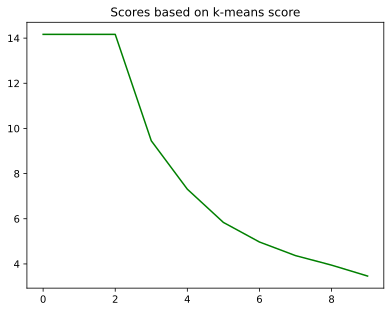

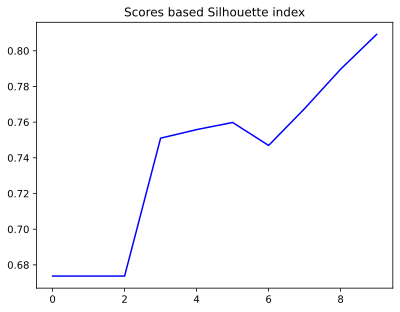

In [18]:
elbowfinder(bestkmeansobjective,bestsilobjective)

### 2.7 Testing some more

In [19]:
def moretest(data,minclusters,maxclusters, bestsilclusters,bestkmeansclusters, style='ro', centroid=True, xlabel='', ylabel='',\
            colorpalette=["#de324c","#e95e56","#f4895f","#f8e16f","#2ac196","#95cf92","#66b5af","#369acc","#6678b7","#9656a2"],\
            index1=0, index2=1):
    colorarray = colorpalette
    
    for k in range(minclusters,maxclusters):
        plt.figure()
        for l in range (0,k+1):
            datax=[]
            datay=[]
            for i in range(0, len (bestsilclusters[k])):
                if bestsilclusters[k][i]==l:
                    datax.append(data[i][index1])
                    datay.append(data[i][index2])                      
            plt.plot(datax, datay, style, color=colorarray[l]) 
            centerx=[]
            centerx.append(np.average(datax))
            centery=[]
            centery.append(np.average(datay))
            if centroid == True:
                plt.plot(centerx, centery, style, color='black')
        #a = 'Best clusters silhoutte score of with ' +str(k) +' clusters'
        plt.title('Best clusters silhoutte score of '+str( round(bestsilobjective[k],3))+' with '+str(k)+' clusters')
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.show()
        plt.figure()
        for l in range (0,k+1):
            datax=[]
            datay=[]
            for i in range(0, len (bestkmeansclusters[k])):
                if bestkmeansclusters[k][i]==l:
                    datax.append(data[i][index1])
                    datay.append(data[i][index2])                      
            plt.plot(datax, datay, style, color=colorarray[l]) 
            centerx=[]
            centerx.append(np.average(datax))
            centery=[]
            centery.append(np.average(datay))
            if centroid == True:
                plt.plot(centerx, centery, style, color='black') 
       
        if scalethedata==True:
            plt.title('Best clusters kmeans score of ' +str( round(bestkmeansobjective[k],3))+' with '+str(k) +' clusters SCALED DATA SCORE')
        else:
            plt.title('Best clusters kmeans score of ' +str( round(bestkmeansobjective[k],3))+' with '+str(k) +' clusters')
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)    
        plt.show()


/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(datax, datay, style, color=colorarray[l])
/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:21: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(centerx, centery, style, color='black')
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


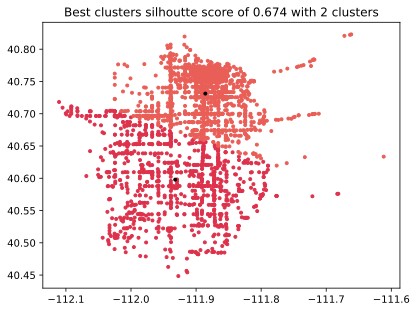

/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(datax, datay, style, color=colorarray[l])
/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:41: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r." (-> color='r'). The keyword argument will take precedence.
  plt.plot(centerx, centery, style, color='black')


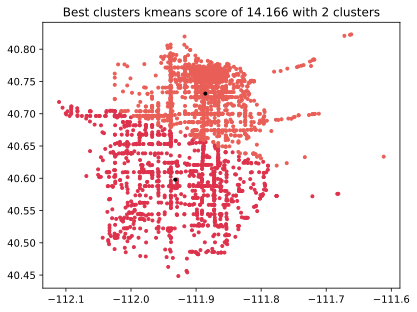

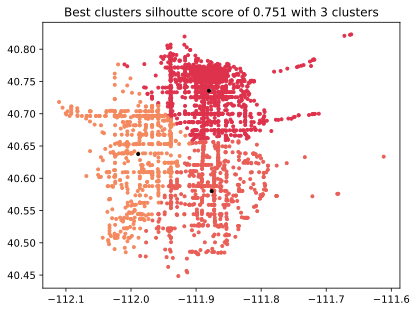

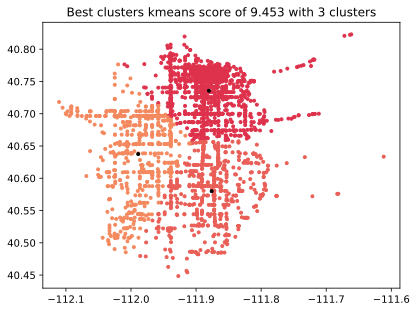

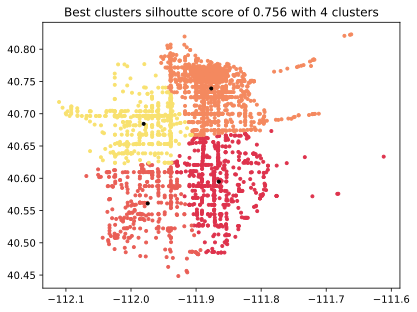

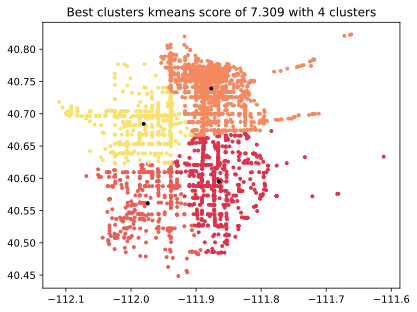

...

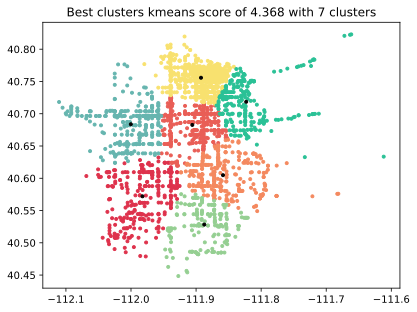

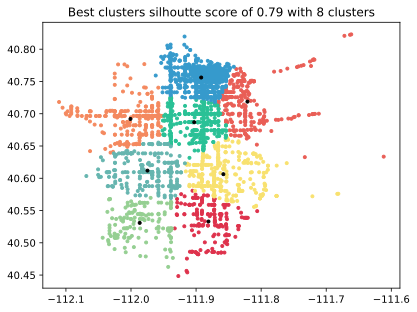

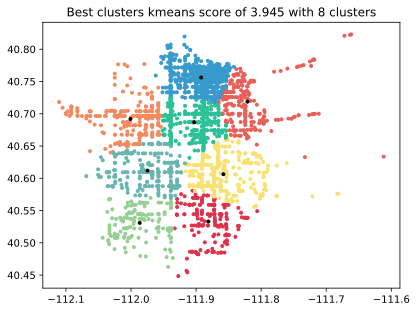

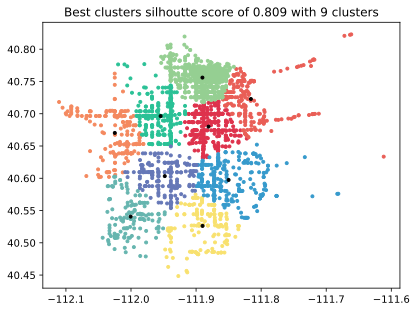

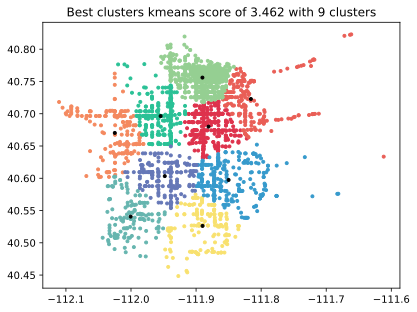

In [20]:
moretest(data,minclusters,maxclusters,bestsilclusters,bestkmeansclusters, style='r.')

## Part 3 -  Cluster Analysis on Speed and Time of Day

In [21]:
minclusters=2
maxclusters=10
numberofkmeanstried=1
scalethedata=True

data_pt3=[]
for i in range(0, len(crash)):
    if not isinstance(crash[i].posted_speed, str) and 5 <= crash[i].posted_speed < 80:
        if crash[i].crash_severity_id >= 3:
            date = pd.to_datetime(crash[i].crash_datetime)
            point = [date.hour, crash[i].posted_speed] #
            data_pt3.append(point)

In [22]:
data_pt3_scaled = scaledata(scalethedata, data_pt3)

In [23]:
bestkmeansobjective,bestsilobjective,bestsilclusters,bestkmeansclusters =  beststuff(data_pt3_scaled,minclusters,maxclusters,scalethedata)

num cluster 2  iteration  0
For k clusters, the best k means score is  36.26014938465295  but the data is scaled
For k clusters, the best silhouette score is  0.704546602163898
num cluster 3  iteration  0
For k clusters, the best k means score is  28.528847691512674  but the data is scaled
For k clusters, the best silhouette score is  0.6369034642035307
num cluster 4  iteration  0
For k clusters, the best k means score is  22.47597302546297  but the data is scaled
For k clusters, the best silhouette score is  0.6777440491598882
num cluster 5  iteration  0
For k clusters, the best k means score is  18.927218932175997  but the data is scaled
For k clusters, the best silhouette score is  0.720401984227634
num cluster 6  iteration  0
For k clusters, the best k means score is  16.55130326678946  but the data is scaled
For k clusters, the best silhouette score is  0.7223975105305677
num cluster 7  iteration  0
For k clusters, the best k means score is  14.35719171180621  but the data is scal

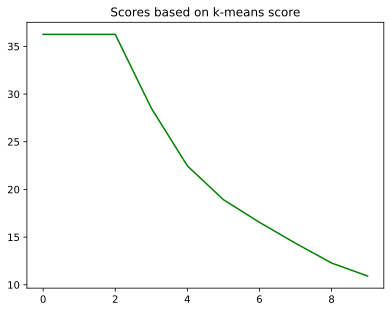

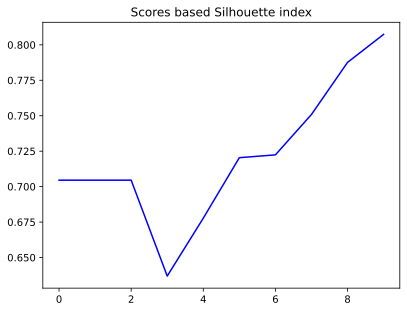

In [24]:
elbowfinder(bestkmeansobjective,bestsilobjective)

/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  plt.plot(datax, datay, style, color=colorarray[l])
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


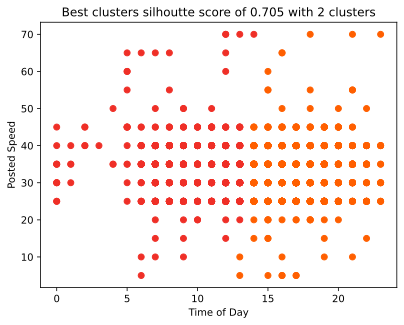

/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  plt.plot(datax, datay, style, color=colorarray[l])


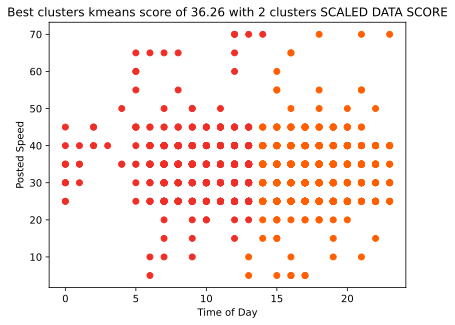

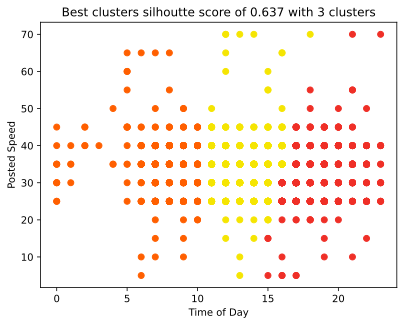

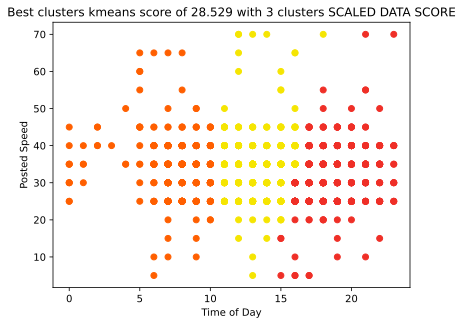

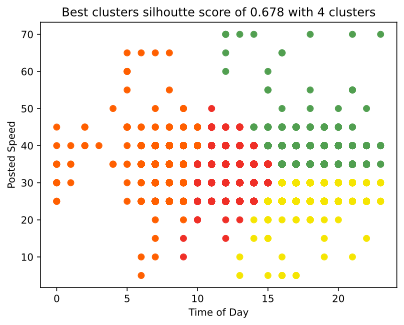

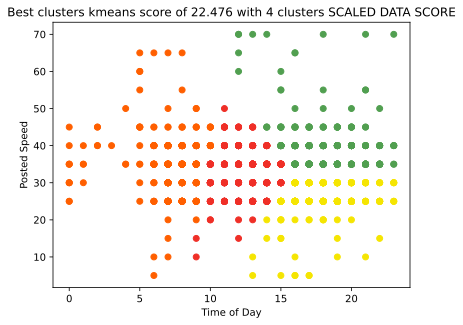

...

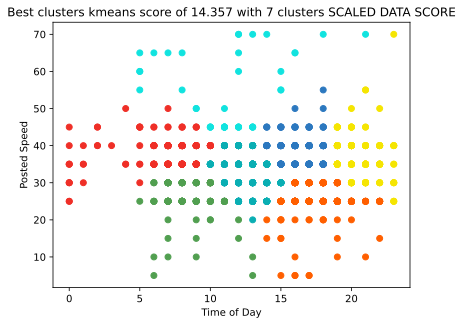

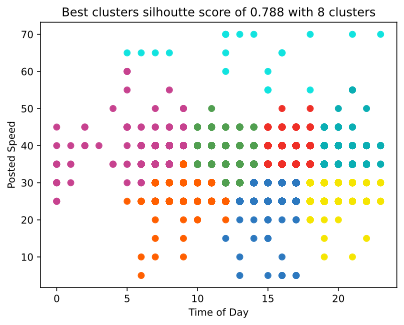

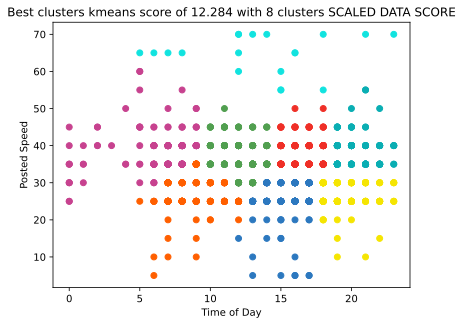

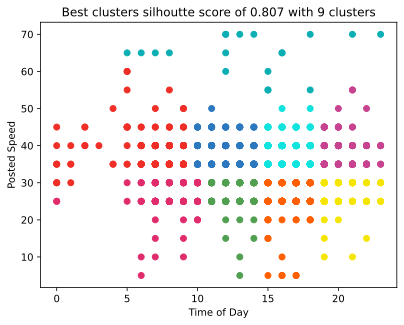

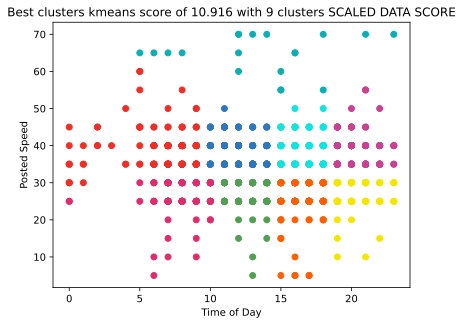

In [25]:
moretest(data_pt3,minclusters,maxclusters,bestsilclusters,bestkmeansclusters, \
         centroid = False, xlabel='Time of Day', ylabel='Posted Speed',\
         colorpalette = ["#ef2f27","#ff5f00","#f5e502","#519f50","#0aaeb3","#11e3df","#2c78bf","#c7428f","#e02c6d","#f096b6"])

## Part 4. Cluster Analysis for 5 Parameters 

### 4.1 Parameters:
Longitude, latitude, light condition, weather condition, posted speed

**Remember to take out the Unknown and Not Provided!**

In [26]:
scalethedata=True
minclusters=2
maxclusters=10
numberofkmeanstried=2

In [27]:
data_pt4=[]
for i in range(0, len(crash)):
    if not isinstance(crash[i].posted_speed, str):
        if crash[i].lat!= 0.0 and crash[i].long!= 0.0 and crash[i].crash_severity_id >= 3 \
        and 1<= crash[i].light_condition_id <= 6 and 1<= crash[i].weather_condition_id <= 9 \
        and 5 <= crash[i].posted_speed <= 80:
            point = [crash[i].long, crash[i].lat, crash[i].light_condition_id, crash[i].weather_condition_id, crash[i].posted_speed] #
            data_pt4.append(point)

In [28]:
data_pt4_scaled = scaledata(scalethedata, data_pt4)

In [29]:
bestkmeansobjective,bestsilobjective,bestsilclusters,bestkmeansclusters =  beststuff(data_pt4_scaled,minclusters,maxclusters,scalethedata)

num cluster 2  iteration  0
For k clusters, the best k means score is  134.41375768739897  but the data is scaled
For k clusters, the best silhouette score is  0.7834420174290971
num cluster 3  iteration  0
For k clusters, the best k means score is  89.08008490233865  but the data is scaled
For k clusters, the best silhouette score is  0.6376852855284008
num cluster 4  iteration  0
For k clusters, the best k means score is  76.65939765031246  but the data is scaled
For k clusters, the best silhouette score is  0.607243012942912
num cluster 5  iteration  0
For k clusters, the best k means score is  70.13573839185814  but the data is scaled
For k clusters, the best silhouette score is  0.6242010018999669
num cluster 6  iteration  0
For k clusters, the best k means score is  64.28294930585517  but the data is scaled
For k clusters, the best silhouette score is  0.6346876153955151
num cluster 7  iteration  0
For k clusters, the best k means score is  60.72219099176414  but the data is scal

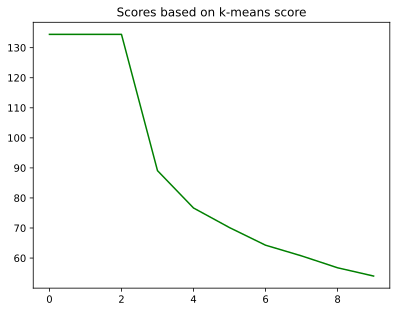

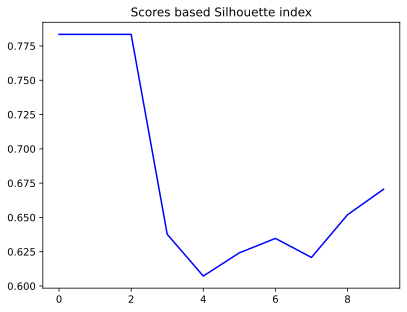

In [30]:
elbowfinder(bestkmeansobjective,bestsilobjective)

/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:15: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  plt.plot(datax, datay, style, color=colorarray[l])
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/opt/anaconda3/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


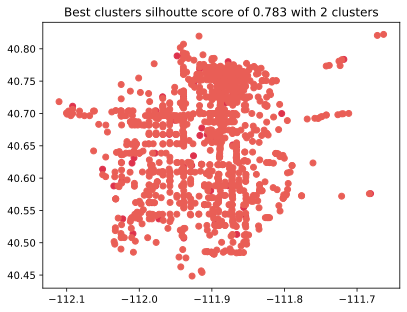

/var/folders/x2/7_89wkws12d5tn83_x0dc2580000gn/T/ipykernel_51534/241746787.py:35: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "ro" (-> color='r'). The keyword argument will take precedence.
  plt.plot(datax, datay, style, color=colorarray[l])


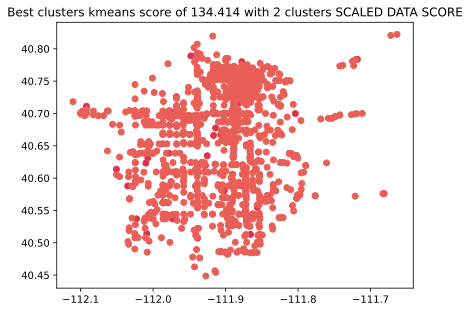

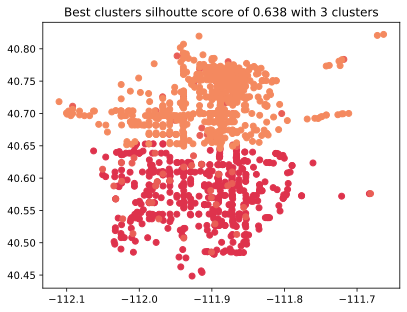

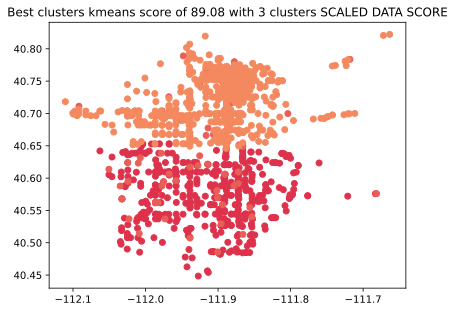

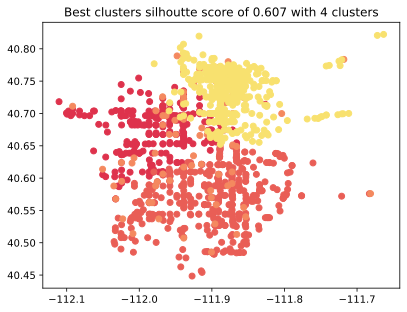

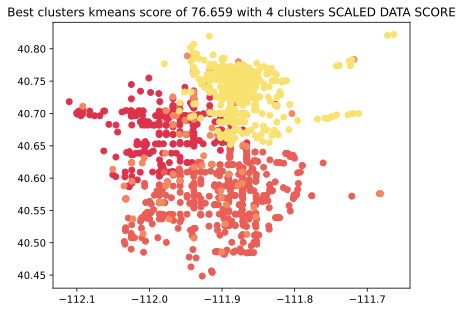

...

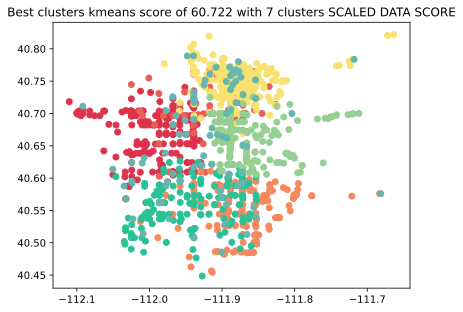

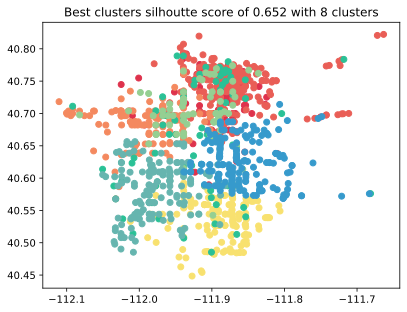

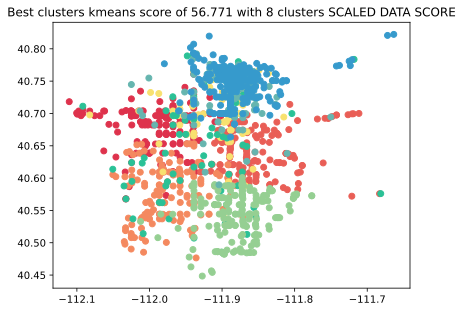

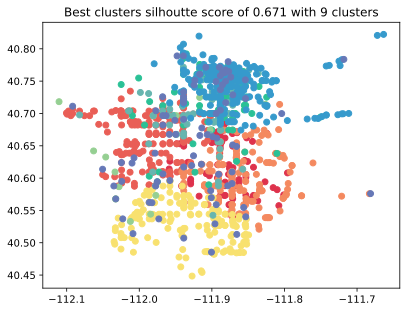

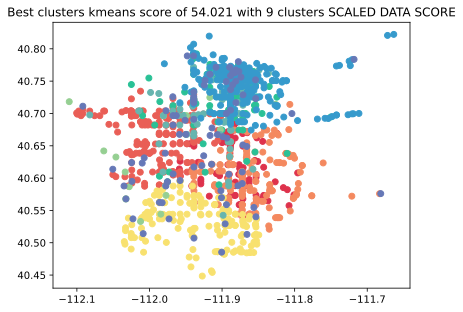

In [31]:
# colorpalette = ["#ef2f27","#ff5f00","#f5e502","#519f50","#0aaeb3","#11e3df","#2c78bf","#c7428f","#e02c6d","#f096b6"]
moretest(data_pt4,minclusters,maxclusters,bestsilclusters,bestkmeansclusters, centroid = False)


## Part 5 Other Analysis

### 5.1 Posted Speed vs. Pedalcylist Injury Severity
Comparing the injury severity of each speed with other speeds

In [32]:
speed = [5,10,15,20,25,30,35,40,45,50,55,60,65,70]
injury = []
for i in range(0,len(speed)):
    temp = []
    for j in range(0, len(crash)):
        if crash[j].posted_speed == speed[i]:
            injury_level = crash[j].injury_level_id[-1][0]
            temp.append(injury_level)
    injury.append(temp)

In [33]:
statdiff = np.zeros(len(speed)) 
statdiffcnt = np.zeros(len(speed))

alphaftest=.2
alphattest=.01

for i in range(0,len(injury)-1):
    for j in range(i+1, len(injury)):     
        datax = injury[i]
        datay = injury[j]

        ###### f test
        alphaftest =.2 
        if np.var(datax)>np.var(datay):
            fteststatistic = np.var(datax)/np.var(datay)
            dfnumerator=len(datax)-1
            dfdenominator=len(datay)-1
        else:
            fteststatistic = np.var(datay)/np.var(datax)
            dfnumerator=len(datay)-1
            dfdenominator=len(datax)-1
        
        pvalueftest = 1-scipy.stats.f.cdf(fteststatistic, dfnumerator, dfdenominator)
        
        ###### t test
        alphattest =.01 
        if pvalueftest>alphaftest:
            equalvar=True
        else:
            equalvar=False
        t=scipy.stats.ttest_ind(datax, datay, axis=0, equal_var=equalvar) 
        pvaluettest= t[1]         
        
        if pvaluettest<alphattest:
            if np.mean(datax) > np.mean(datay):
                statdiff[i] += 1
                statdiff[j] -= 1
            else:
                statdiff[i] -= 1
                statdiff[j] += 1
print('statdiff = ',statdiff)


statdiff =  [ 0.  0.  0.  0. -1.  2. -1.  0.  0.  0.  0.  0.  0.  0.]


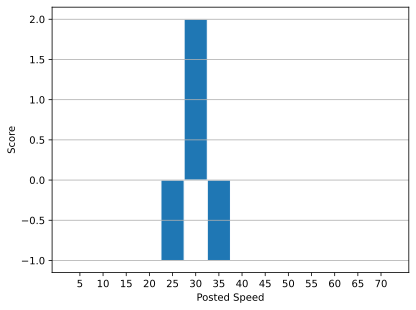

Injuries to pedalcylists on roads with posted speed of 30 mph are statistically more severe than 25 mph and 35 mph roads.


In [34]:
height = statdiff
bars = ('5','10','15','20','25','30','35','40','45','50','55','60','65','70')
y_pos = np.arange(len(bars))

# Create bars
plt.bar(bars, height, width=1, edgecolor="white", ) #linewidth=0.7
plt.grid(axis='y')


plt.xticks(y_pos, bars)
# plt.figure().set_figwidth(5)

plt.xlabel('Posted Speed')
plt.ylabel('Score')

# Show graphic
plt.show()

print('Injuries to pedalcylists on roads with posted speed of 30 mph are statistically more severe than 25 mph and 35 mph roads.')

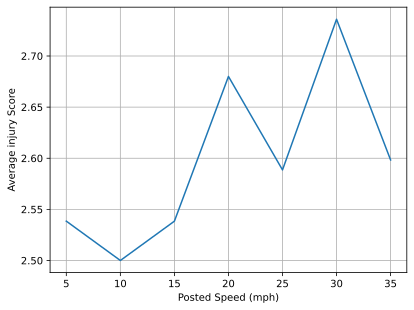

In [35]:
speed = [5,10,15,20,25,30,35,40,45,50,55,60,65,70]
injury_score = []
for i in range(0,len(speed)):
    temp = []
    for j in range(0, len(crash)):
        if crash[j].posted_speed == speed[i]:
            injury_level = crash[j].injury_level_id[-1][0]
            temp.append(injury_level)
    injury_score.append(temp)
    
avg_injury_score = []
for i in range(0, len(injury_score)):
    avg_injury_score.append(np.average(injury_score[i]))

plt.plot(speed[:7],avg_injury_score[:7])
plt.xlabel('Posted Speed (mph)')
plt.ylabel('Average injury Score')
plt.grid()
plt.show()

### 5.2 Are crashes on canyon roads more severe to pedalcylists than the ones on non-canyon roads?

In [49]:
alphaftest=.2
alphattest=.05
# statsig_canyon=0
# statsig_noncanyon=0
# serious_canyon=[]
# canyon=[]
# #####
# for i in range(0, len(crash)):
#     phrase = crash[i].location_description
#     if type(phrase) == str and 'canyon' in phrase.lower():
#         if 3 <= crash[i].injury_level_id[-1][0] <= 5:
#             serious_canyon.append(crash[i].injury_level_id[-1][0])
#         else:
#             canyon.append(crash[i].injury_level_id[-1][0])

In [46]:
serious_canyon=[] 
canyon=[]
serious_noncanyon = []
noncanyon = []

total_canyon = []
total_noncanyon = []


for i in range(0, len(crash)):
    phrase = crash[i].location_description
    injury_level = crash[i].injury_level_id[-1][0]
    if type(phrase) == str:
        if 'canyon' in phrase.lower() or 'cyn' in phrase.lower(): # or 'cyn'
            total_canyon.append(injury_level)
        else:
            total_noncanyon.append(injury_level)

        # Serious injuries
        if 4 <= injury_level <= 5:
            if 'canyon'in phrase.lower() or 'cyn'  in phrase.lower():
                serious_canyon.append(injury_level)
            else:
                serious_noncanyon.append(injury_level)
        elif 1<= injury_level <= 3:
            if 'canyon' in phrase.lower() or 'cyn'  in phrase.lower():
                canyon.append(injury_level)
            else:
                noncanyon.append(injury_level)

print(len(serious_canyon)/(len(serious_canyon)+len(canyon)))  
print(len(serious_noncanyon)/(len(serious_noncanyon)+len(noncanyon)))


0.18181818181818182
0.08970554667884045


In [47]:
def runfandttestfortpvalue(datax,datay,alphaftest, alphattest):
    if np.var(datax)>np.var(datay):
        fteststatistic = np.var(datax)/np.var(datay)
        dfnumerator=len(datax)-1
        dfdenominator=len(datay)-1
    else:
        fteststatistic = np.var(datay)/np.var(datax)
        dfnumerator=len(datay)-1
        dfdenominator=len(datax)-1
    
    pvalueftest = 1-scipy.stats.f.cdf(fteststatistic, dfnumerator, dfdenominator)
    if pvalueftest>alphaftest:
        equalvar=True
    else:
        equalvar=False
    t=scipy.stats.ttest_ind(datax, datay, axis=0, equal_var=equalvar) 
    pvaluettest= t[1]         
    return(pvaluettest)

In [48]:
pvaluettest = runfandttestfortpvalue(total_canyon,total_noncanyon,alphaftest, alphattest)
if pvaluettest<alphattest:
    print (' Reject that the means are equal' , 100*(1-alphattest) , ' percent confidence')
else:
    print('Fail to reject the null hypothesis')

Fail to reject the null hypothesis


### Conclusion:
There is not enough evidence to say crashes on canyon roads are more severe to the cylists than those on non-canyon roads